# Exploratory Data Analysis 

**Author:** *Ishan Singh Bhullar*<br>
**Created:** *11 December 2022*<br>
**Contact:** *ishanbhullar@gmail.com*<br>
**Last Edit:** *10 September 2024*<br>

## Table of Contents

1. [Introduction](#Introduction)<br><br>
2. [Feature Engineering](#Feature-Engineering)<br><br>
    - [`category` column](#category-column)<br><br>
    - [Target Variable: Introducing Lag in Surface Wind Field to Find an Intensity Delta](#Target-Variable:-Introducing-Lag-in-Surface-Wind-Field-to-Find-an-Intensity-Delta)<br><br>
    - [Separating Direction and Speed for u and v Wind](#Separating-Direction-and-Speed-for-u-and-v-Wind)<br><br>
3. [Exploratory Data Analysis (EDA)](#Exploratory-Data-Analysis-(EDA))<br><br>
    - [Plotting Column Distributions](#Plotting-Column-Distributions)<br><br>
    - [Relationships and Correlation between Variables](#Relationships-and-Correlation-between-Variables)<br><br>
4. [Summary of Findings](#Summary-of-Findings)<br><br>

## Introduction


In this notebook I will load the combined dataset containing track information as well as corresponding weather data extracted from ERA5 .grib files. 

There is some data wrangling needed such as changing column names to make them easier to interpret and use. I will also be doing some feature engineering to create a target variable for modeling, as well as dealing with some categorical and vector variables.

Then there is the Exploratory Data Analysis section where I will take a closer look at the distributions of the features and the possible realtionships/correlations between them. 

### Importing Relevant Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [2]:
from datetime import datetime
from tqdm import tqdm
import time
import warnings
warnings.filterwarnings("ignore")

### Custom Functions

In [3]:
def dist_plot(df, col, plot, bins=25):
    '''
    Function to plot distribution of a column from dataframe
    
    Parameters
    -----
    df: pandas dataframe.
    col: names of columns passed as a 'string', no default value.
    plot: 'hist'or 'bar'. Type of distribution plot passed as 'string', default value is 'hist' or histogram.
    bins: number of bins for histogram plot, default value of 25.
    
    Returns
    -----
    No values returned.
    
    Output
    -----
    Appropriate distribution plot based on parameters received.
    Outputs error if right plot not received. 
    Outputs error if column name not present in dataframe
    '''
    # check if dataframe passed in a pandas dataframe
    assert isinstance(df, pd.DataFrame), 'Please enter a Pandas DataFrame!!'
    # check if column present in storm_df
    assert col in df.columns, 'Column not present in DataFrame!!'
        
    # check if valid plot value received
    assert plot in ['hist', 'bar'], 'Please enter a valid Plot Type!!'
            
    
    # plot distribution based on plot value
    if plot == 'hist':
        plt.figure()
        plt.hist(df[col], bins=bins, alpha=0.5)
        plt.title('Distribution for '+col)
        plt.xlabel(col+' in bins')
        plt.ylabel('Count')
        plt.axvline(df[col].mean(), linestyle=':', color='r', label='Mean')
        plt.axvline(df[col].median(), linestyle='-', color='r', label='Median')
        plt.legend()
        sns.despine()
        plt.show()
    else:
        plt.figure()
        df[col].value_counts().plot(kind='bar', alpha=0.5, colormap='plasma')
        plt.title('Distribution for '+col)
        sns.despine()
        plt.show()
      

### Reading and Wrangling Data

In [4]:
# read from csv
storm_df = pd.read_csv("data/final_data.csv", index_col=0)

Range of checks to ensure data loaded in properly. 

In [5]:
storm_df.head()

,sid,season,number,name,iso_time,lat,lon,dist2land,usa_status,usa_wind,...,geo_550,u_wind_550,v_wind_550,humid_550,temp_550,geo_850,u_wind_850,v_wind_850,humid_850,temp_850
0,1959148N23274,1959,34,ARLENE,1959-06-01 00:00:00,32.1000,-90.5000,0,TD,25.0,...,49941.254,1.885500,0.103929,0.002964,271.66333,14684.576,1.299480,2.507897,0.012479,289.99377
1,1959148N23274,1959,34,ARLENE,1959-06-01 03:00:00,32.2799,-90.2298,0,TD,25.0,...,49987.504,2.200415,-1.907968,0.002965,271.37140,14733.608,0.864694,2.880090,0.012505,289.87040
2,1959148N23274,1959,34,ARLENE,1959-06-01 06:00:00,32.4000,-89.9000,0,TD,25.0,...,49970.445,0.941431,-2.847706,0.002744,270.90920,14732.032,2.117519,3.888728,0.012374,289.78470
3,1959148N23274,1959,34,ARLENE,1959-06-01 09:00:00,32.5150,-89.5150,0,TD,25.0,...,49834.910,-0.539520,-1.913183,0.002330,270.31130,14646.824,3.203289,2.605515,0.012358,289.40665
4,1959148N23274,1959,34,ARLENE,1959-06-01 12:00:00,32.6000,-89.1000,0,TD,25.0,...,49830.684,2.249538,1.893531,0.003163,270.08840,14696.572,2.416132,0.628975,0.012528,289.29062


In [6]:
# Check shape of dataset
print(f'Dataset has {storm_df.shape[0]} rows and {storm_df.shape[1]} columns!')

Dataset has 28800 rows and 29 columns!


In [7]:
storm_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28800 entries, 0 to 28799
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   sid          28800 non-null  object 
 1   season       28800 non-null  int64  
 2   number       28800 non-null  int64  
 3   name         28800 non-null  object 
 4   iso_time     28800 non-null  object 
 5   lat          28800 non-null  float64
 6   lon          28800 non-null  float64
 7   dist2land    28800 non-null  int64  
 8   usa_status   28800 non-null  object 
 9   usa_wind     28800 non-null  float64
 10  usa_pres     28800 non-null  float64
 11  usa_sshs     28800 non-null  int64  
 12  storm_speed  28800 non-null  int64  
 13  storm_dir    28800 non-null  int64  
 14  geo_250      28800 non-null  float64
 15  u_wind_250   28800 non-null  float64
 16  v_wind_250   28800 non-null  float64
 17  humid_250    28800 non-null  float64
 18  temp_250     28800 non-null  float64
 19  geo_

We can drop the `usa_status` and `number` columns as they were only useful for cleaning the data.

In [8]:
storm_df.drop(columns=['usa_status', 'number'], inplace=True)

In [9]:
storm_df.info() # sanity check

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28800 entries, 0 to 28799
Data columns (total 27 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   sid          28800 non-null  object 
 1   season       28800 non-null  int64  
 2   name         28800 non-null  object 
 3   iso_time     28800 non-null  object 
 4   lat          28800 non-null  float64
 5   lon          28800 non-null  float64
 6   dist2land    28800 non-null  int64  
 7   usa_wind     28800 non-null  float64
 8   usa_pres     28800 non-null  float64
 9   usa_sshs     28800 non-null  int64  
 10  storm_speed  28800 non-null  int64  
 11  storm_dir    28800 non-null  int64  
 12  geo_250      28800 non-null  float64
 13  u_wind_250   28800 non-null  float64
 14  v_wind_250   28800 non-null  float64
 15  humid_250    28800 non-null  float64
 16  temp_250     28800 non-null  float64
 17  geo_550      28800 non-null  float64
 18  u_wind_550   28800 non-null  float64
 19  v_wi

Let's rename the following columns to make them more interpretable and easier to work with.
1. `iso_time` to `time`
2. `usa_wind` to `wind_surface`
3. `usa_pres` to `pressure_surface`
4. `usa_sshs` to `category`

In [10]:
# mapper dictionary with old names as keys
column_mapper = {'iso_time': 'time', 'usa_wind': 'wind_surface', 'usa_pres': 'pressure_surface', 'usa_sshs': 'category'}
storm_df.rename(columns = column_mapper, inplace=True)
storm_df.head()

,sid,season,name,time,lat,lon,dist2land,wind_surface,pressure_surface,category,...,geo_550,u_wind_550,v_wind_550,humid_550,temp_550,geo_850,u_wind_850,v_wind_850,humid_850,temp_850
0,1959148N23274,1959,ARLENE,1959-06-01 00:00:00,32.1000,-90.5000,0,25.0,1008.0,-1,...,49941.254,1.885500,0.103929,0.002964,271.66333,14684.576,1.299480,2.507897,0.012479,289.99377
1,1959148N23274,1959,ARLENE,1959-06-01 03:00:00,32.2799,-90.2298,0,25.0,1008.0,-1,...,49987.504,2.200415,-1.907968,0.002965,271.37140,14733.608,0.864694,2.880090,0.012505,289.87040
2,1959148N23274,1959,ARLENE,1959-06-01 06:00:00,32.4000,-89.9000,0,25.0,1008.0,-1,...,49970.445,0.941431,-2.847706,0.002744,270.90920,14732.032,2.117519,3.888728,0.012374,289.78470
3,1959148N23274,1959,ARLENE,1959-06-01 09:00:00,32.5150,-89.5150,0,25.0,1008.0,-1,...,49834.910,-0.539520,-1.913183,0.002330,270.31130,14646.824,3.203289,2.605515,0.012358,289.40665
4,1959148N23274,1959,ARLENE,1959-06-01 12:00:00,32.6000,-89.1000,0,25.0,1008.0,-1,...,49830.684,2.249538,1.893531,0.003163,270.08840,14696.572,2.416132,0.628975,0.012528,289.29062


In [11]:
storm_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28800 entries, 0 to 28799
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   sid               28800 non-null  object 
 1   season            28800 non-null  int64  
 2   name              28800 non-null  object 
 3   time              28800 non-null  object 
 4   lat               28800 non-null  float64
 5   lon               28800 non-null  float64
 6   dist2land         28800 non-null  int64  
 7   wind_surface      28800 non-null  float64
 8   pressure_surface  28800 non-null  float64
 9   category          28800 non-null  int64  
 10  storm_speed       28800 non-null  int64  
 11  storm_dir         28800 non-null  int64  
 12  geo_250           28800 non-null  float64
 13  u_wind_250        28800 non-null  float64
 14  v_wind_250        28800 non-null  float64
 15  humid_250         28800 non-null  float64
 16  temp_250          28800 non-null  float6

We need to change the dtype of the `time` column to *datetime* format.

In [12]:
storm_df['time'] = pd.to_datetime(storm_df['time'])
storm_df.head()

,sid,season,name,time,lat,lon,dist2land,wind_surface,pressure_surface,category,...,geo_550,u_wind_550,v_wind_550,humid_550,temp_550,geo_850,u_wind_850,v_wind_850,humid_850,temp_850
0,1959148N23274,1959,ARLENE,1959-06-01 00:00:00,32.1000,-90.5000,0,25.0,1008.0,-1,...,49941.254,1.885500,0.103929,0.002964,271.66333,14684.576,1.299480,2.507897,0.012479,289.99377
1,1959148N23274,1959,ARLENE,1959-06-01 03:00:00,32.2799,-90.2298,0,25.0,1008.0,-1,...,49987.504,2.200415,-1.907968,0.002965,271.37140,14733.608,0.864694,2.880090,0.012505,289.87040
2,1959148N23274,1959,ARLENE,1959-06-01 06:00:00,32.4000,-89.9000,0,25.0,1008.0,-1,...,49970.445,0.941431,-2.847706,0.002744,270.90920,14732.032,2.117519,3.888728,0.012374,289.78470
3,1959148N23274,1959,ARLENE,1959-06-01 09:00:00,32.5150,-89.5150,0,25.0,1008.0,-1,...,49834.910,-0.539520,-1.913183,0.002330,270.31130,14646.824,3.203289,2.605515,0.012358,289.40665
4,1959148N23274,1959,ARLENE,1959-06-01 12:00:00,32.6000,-89.1000,0,25.0,1008.0,-1,...,49830.684,2.249538,1.893531,0.003163,270.08840,14696.572,2.416132,0.628975,0.012528,289.29062


In [13]:
storm_df.info() # sanity check

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28800 entries, 0 to 28799
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   sid               28800 non-null  object        
 1   season            28800 non-null  int64         
 2   name              28800 non-null  object        
 3   time              28800 non-null  datetime64[ns]
 4   lat               28800 non-null  float64       
 5   lon               28800 non-null  float64       
 6   dist2land         28800 non-null  int64         
 7   wind_surface      28800 non-null  float64       
 8   pressure_surface  28800 non-null  float64       
 9   category          28800 non-null  int64         
 10  storm_speed       28800 non-null  int64         
 11  storm_dir         28800 non-null  int64         
 12  geo_250           28800 non-null  float64       
 13  u_wind_250        28800 non-null  float64       
 14  v_wind_250        2880

Lastly, the temperatures in `temp_250`, `temp_550`, and `temp_850` have the unit Kelvin. Let's convert this to the more universally interpretable Celsius.

In [14]:
# changing unit of `temp_250` to Celsius
storm_df['temp_250'] = storm_df['temp_250'] - 273.15
storm_df['temp_250']

0       -43.81610
1       -44.13892
2       -44.42086
3       -44.95869
4       -43.88227
           ...   
28795   -39.80688
28796   -39.88941
28797   -40.15996
28798   -40.96080
28799   -40.95984
Name: temp_250, Length: 28800, dtype: float64

In [15]:
# changing unit of `temp_550` to Celsius
storm_df['temp_550'] = storm_df['temp_550'] - 273.15
storm_df['temp_550']

0       -1.48667
1       -1.77860
2       -2.24080
3       -2.83870
4       -3.06160
          ...   
28795   -1.95096
28796   -2.08750
28797   -1.86070
28798   -2.24042
28799   -2.64298
Name: temp_550, Length: 28800, dtype: float64

In [16]:
# changing unit of `temp_850` to Celsius
storm_df['temp_850'] = storm_df['temp_850'] - 273.15
storm_df['temp_850']

0        16.84377
1        16.72040
2        16.63470
3        16.25665
4        16.14062
           ...   
28795    17.32067
28796    17.38998
28797    17.11355
28798    17.13024
28799    17.11343
Name: temp_850, Length: 28800, dtype: float64

Units of all temperature fields changed to Celsius successfully.

-----

## Feature Engineering

### `category` column

Let's take a close look at the `category` column. The ratings are based on the Saffir-Simpson Hurricane Scale. Refer to [IBTrACS column documentation](https://www.ncei.noaa.gov/sites/default/files/2021-07/IBTrACS_v04_column_documentation.pdf) for more information. 

In [17]:
# unique values in column
storm_df['category'].value_counts()

-1    10860
 0     8982
 1     4068
 2     1569
-2     1104
 3      823
 4      507
-3      399
-5      384
 5      104
Name: category, dtype: int64

In [18]:
# exploring category value -3 closer
storm_df[storm_df['category']==-3][['wind_surface']].value_counts()

wind_surface
25.0            133
20.0             89
15.0             57
30.0             51
10.0             24
35.0             12
22.0             10
27.0              9
40.0              7
32.0              3
17.0              2
12.0              1
37.0              1
dtype: int64

For our purposes it will be better to convert this to a simpler scale based on wind speeds as follows:

- 'depression' - `wind_surface` <= 34 kts
- 'storm' - 34 < `wind_surface` <= 96 kt
- 'severe' - `wind_surface` > 96 kts

In [19]:
# df.apply with a lambda function to create category labels based on surface wind speed
storm_df['category'] = storm_df['wind_surface'].apply(lambda x: 'depression' if x <= 34 else ('storm' if 34 < x <= 96 else 'severe'))
# sanity check
storm_df['category'].value_counts()

storm         15346
depression    12020
severe         1434
Name: category, dtype: int64

In [20]:
# sanity check
storm_df.head()

,sid,season,name,time,lat,lon,dist2land,wind_surface,pressure_surface,category,...,geo_550,u_wind_550,v_wind_550,humid_550,temp_550,geo_850,u_wind_850,v_wind_850,humid_850,temp_850
0,1959148N23274,1959,ARLENE,1959-06-01 00:00:00,32.1000,-90.5000,0,25.0,1008.0,depression,...,49941.254,1.885500,0.103929,0.002964,-1.48667,14684.576,1.299480,2.507897,0.012479,16.84377
1,1959148N23274,1959,ARLENE,1959-06-01 03:00:00,32.2799,-90.2298,0,25.0,1008.0,depression,...,49987.504,2.200415,-1.907968,0.002965,-1.77860,14733.608,0.864694,2.880090,0.012505,16.72040
2,1959148N23274,1959,ARLENE,1959-06-01 06:00:00,32.4000,-89.9000,0,25.0,1008.0,depression,...,49970.445,0.941431,-2.847706,0.002744,-2.24080,14732.032,2.117519,3.888728,0.012374,16.63470
3,1959148N23274,1959,ARLENE,1959-06-01 09:00:00,32.5150,-89.5150,0,25.0,1008.0,depression,...,49834.910,-0.539520,-1.913183,0.002330,-2.83870,14646.824,3.203289,2.605515,0.012358,16.25665
4,1959148N23274,1959,ARLENE,1959-06-01 12:00:00,32.6000,-89.1000,0,25.0,1008.0,depression,...,49830.684,2.249538,1.893531,0.003163,-3.06160,14696.572,2.416132,0.628975,0.012528,16.14062


`category` values changed successfully. 

### Target Variable: Introducing Lag in Surface Wind Field to Find an Intensity Delta

In order to eventually conduct Time-Series analysis, I will introduce a 2-step (6 hour) lag to the `wind_surface` column. This lagged wind column, `wind_lag` will be my target variable for future regression modelling. 

For now, I will use this column to add another column, `intensity_delta`. This will be a binary column, that indicates whether the surface wind increased or not over the 6-hour window. A value of '1' denotes an increase and a value of '0' denotes no-increase i.e. either no change or a decrease.

In [21]:
# add nan column to dataframe
storm_df['wind_lag'] = np.nan
storm_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28800 entries, 0 to 28799
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   sid               28800 non-null  object        
 1   season            28800 non-null  int64         
 2   name              28800 non-null  object        
 3   time              28800 non-null  datetime64[ns]
 4   lat               28800 non-null  float64       
 5   lon               28800 non-null  float64       
 6   dist2land         28800 non-null  int64         
 7   wind_surface      28800 non-null  float64       
 8   pressure_surface  28800 non-null  float64       
 9   category          28800 non-null  object        
 10  storm_speed       28800 non-null  int64         
 11  storm_dir         28800 non-null  int64         
 12  geo_250           28800 non-null  float64       
 13  u_wind_250        28800 non-null  float64       
 14  v_wind_250        2880

In [22]:
# populate wind_lag column using pd.shift on wind_surface column
# pd.where to make sure wind values are not mixed across different storms
storm_df['wind_lag'] = storm_df['wind_surface'].shift(2).where((storm_df['sid'] == storm_df['sid'].shift(2, axis=0)), np.nan, axis=0)

In [23]:
# sanity check
storm_df[['sid', 'wind_surface', 'wind_lag']].head(20)

,sid,wind_surface,wind_lag
0,1959148N23274,25.0,NaN
1,1959148N23274,25.0,NaN
2,1959148N23274,25.0,25.0
3,1959148N23274,25.0,25.0
4,1959148N23274,25.0,25.0
5,1959148N23274,25.0,25.0
6,1959148N23274,25.0,25.0
7,1959148N23274,22.0,25.0
8,1959148N23274,20.0,25.0
9,1959148N23274,20.0,22.0


In [24]:
# sanity check
storm_df.head()

,sid,season,name,time,lat,lon,dist2land,wind_surface,pressure_surface,category,...,u_wind_550,v_wind_550,humid_550,temp_550,geo_850,u_wind_850,v_wind_850,humid_850,temp_850,wind_lag
0,1959148N23274,1959,ARLENE,1959-06-01 00:00:00,32.1000,-90.5000,0,25.0,1008.0,depression,...,1.885500,0.103929,0.002964,-1.48667,14684.576,1.299480,2.507897,0.012479,16.84377,NaN
1,1959148N23274,1959,ARLENE,1959-06-01 03:00:00,32.2799,-90.2298,0,25.0,1008.0,depression,...,2.200415,-1.907968,0.002965,-1.77860,14733.608,0.864694,2.880090,0.012505,16.72040,NaN
2,1959148N23274,1959,ARLENE,1959-06-01 06:00:00,32.4000,-89.9000,0,25.0,1008.0,depression,...,0.941431,-2.847706,0.002744,-2.24080,14732.032,2.117519,3.888728,0.012374,16.63470,25.0
3,1959148N23274,1959,ARLENE,1959-06-01 09:00:00,32.5150,-89.5150,0,25.0,1008.0,depression,...,-0.539520,-1.913183,0.002330,-2.83870,14646.824,3.203289,2.605515,0.012358,16.25665,25.0
4,1959148N23274,1959,ARLENE,1959-06-01 12:00:00,32.6000,-89.1000,0,25.0,1008.0,depression,...,2.249538,1.893531,0.003163,-3.06160,14696.572,2.416132,0.628975,0.012528,16.14062,25.0


`wind_lag` column created successfully . As expected, a number of NaNs have been introduced. Let's see exactly how many. 

In [25]:
storm_df.isnull().sum() # checking number of null values after introducing lag

sid                    0
season                 0
name                   0
time                   0
lat                    0
lon                    0
dist2land              0
wind_surface           0
pressure_surface       0
category               0
storm_speed            0
storm_dir              0
geo_250                0
u_wind_250             0
v_wind_250             0
humid_250              0
temp_250               0
geo_550                0
u_wind_550             0
v_wind_550             0
humid_550              0
temp_550               0
geo_850                0
u_wind_850             0
v_wind_850             0
humid_850              0
temp_850               0
wind_lag            1269
dtype: int64

The `wind_lag` column has 1269 NaN values. For our analysis we have to drop these rows as we cannot have NaNs in our target variable. 

In [26]:
# dropping rows with null values in `wind_lag` column
storm_df.dropna(inplace=True)
# reset the dataframe index and drop the old one
storm_df.reset_index(inplace=True, drop=True)
# sanity check
storm_df.head()

,sid,season,name,time,lat,lon,dist2land,wind_surface,pressure_surface,category,...,u_wind_550,v_wind_550,humid_550,temp_550,geo_850,u_wind_850,v_wind_850,humid_850,temp_850,wind_lag
0,1959148N23274,1959,ARLENE,1959-06-01 06:00:00,32.4000,-89.9000,0,25.0,1008.0,depression,...,0.941431,-2.847706,0.002744,-2.24080,14732.032,2.117519,3.888728,0.012374,16.63470,25.0
1,1959148N23274,1959,ARLENE,1959-06-01 09:00:00,32.5150,-89.5150,0,25.0,1008.0,depression,...,-0.539520,-1.913183,0.002330,-2.83870,14646.824,3.203289,2.605515,0.012358,16.25665,25.0
2,1959148N23274,1959,ARLENE,1959-06-01 12:00:00,32.6000,-89.1000,0,25.0,1008.0,depression,...,2.249538,1.893531,0.003163,-3.06160,14696.572,2.416132,0.628975,0.012528,16.14062,25.0
3,1959148N23274,1959,ARLENE,1959-06-01 15:00:00,32.6571,-88.7223,0,25.0,1008.0,depression,...,5.720097,1.443587,0.003026,-3.29163,14790.435,1.855446,0.008528,0.012527,16.13122,25.0
4,1959148N23274,1959,ARLENE,1959-06-01 18:00:00,32.7000,-88.3000,0,25.0,1008.0,depression,...,7.111703,1.278648,0.003035,-2.72470,14740.469,3.242616,1.736286,0.012614,16.02972,25.0


In [27]:
# sanity check 
storm_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27531 entries, 0 to 27530
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   sid               27531 non-null  object        
 1   season            27531 non-null  int64         
 2   name              27531 non-null  object        
 3   time              27531 non-null  datetime64[ns]
 4   lat               27531 non-null  float64       
 5   lon               27531 non-null  float64       
 6   dist2land         27531 non-null  int64         
 7   wind_surface      27531 non-null  float64       
 8   pressure_surface  27531 non-null  float64       
 9   category          27531 non-null  object        
 10  storm_speed       27531 non-null  int64         
 11  storm_dir         27531 non-null  int64         
 12  geo_250           27531 non-null  float64       
 13  u_wind_250        27531 non-null  float64       
 14  v_wind_250        2753

In [28]:
print(f'We are left with {storm_df.shape[0]} rows and {storm_df.shape[1]} columns.')

We are left with 27531 rows and 28 columns.


Now to add the `intensity_delta` column populated with '0' as default values.

In [29]:
# create new column with default value as 0
storm_df['intensity_delta'] = 0
storm_df.columns

Index(['sid', 'season', 'name', 'time', 'lat', 'lon', 'dist2land',
       'wind_surface', 'pressure_surface', 'category', 'storm_speed',
       'storm_dir', 'geo_250', 'u_wind_250', 'v_wind_250', 'humid_250',
       'temp_250', 'geo_550', 'u_wind_550', 'v_wind_550', 'humid_550',
       'temp_550', 'geo_850', 'u_wind_850', 'v_wind_850', 'humid_850',
       'temp_850', 'wind_lag', 'intensity_delta'],
      dtype='object')

In [30]:
# sanity check
storm_df['intensity_delta'].head()

0    0
1    0
2    0
3    0
4    0
Name: intensity_delta, dtype: int64

In [31]:
# use pd.where to change intensity_delta values to 1 where wind_surface is greater than wind_lag
storm_df['intensity_delta'].where(storm_df['wind_surface'] <= storm_df['wind_lag'], 1, axis=0, inplace=True)
# sanity check
storm_df['intensity_delta'].value_counts(normalize=True)
                          

0    0.690313
1    0.309687
Name: intensity_delta, dtype: float64

In [32]:
# sanity check
storm_df[['wind_surface', 'wind_lag', 'intensity_delta']].head(15)

,wind_surface,wind_lag,intensity_delta
0,25.0,25.0,0
1,25.0,25.0,0
2,25.0,25.0,0
3,25.0,25.0,0
4,25.0,25.0,0
5,22.0,25.0,0
6,20.0,25.0,0
7,20.0,22.0,0
8,20.0,20.0,0
9,20.0,20.0,0


`intensity_delta` created successfully. Plus, we can see that ~31% of the sets of weather conditions (rows) lead to an increase in surface winds.

### Separating Direction and Speed for u and v Wind

`u-wind` denotes the _eastward_ component of horizontal wind and `v-wind` represents the __northward_ component of horizontal wind. Negative sign indicates _westward_ wind for `u-wind` and _southward_ wind for `v-wind`. Let's separate the directional component from both these variables (at the three pressure levels) and create new binary columns to store it. This should give us a better idea of the effect of magnitude and direction of horizontal wind on our target variable, `intensity_delta`.

In [33]:
# new direction columns for u and v wind at different pressure levels
pressure_levels = [250, 550, 850] # list of pressure levels

for pressure in tqdm(pressure_levels):
    
    storm_df['u_dir_'+str(pressure)] = np.where(storm_df['u_wind_'+str(pressure)]>0, 1, 0)
    storm_df['v_dir_'+str(pressure)] = np.where(storm_df['v_wind_'+str(pressure)]>0, 1, 0)
    
storm_df.info()
    

100%|██████████| 3/3 [00:00<00:00, 748.31it/s]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27531 entries, 0 to 27530
Data columns (total 35 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   sid               27531 non-null  object        
 1   season            27531 non-null  int64         
 2   name              27531 non-null  object        
 3   time              27531 non-null  datetime64[ns]
 4   lat               27531 non-null  float64       
 5   lon               27531 non-null  float64       
 6   dist2land         27531 non-null  int64         
 7   wind_surface      27531 non-null  float64       
 8   pressure_surface  27531 non-null  float64       
 9   category          27531 non-null  object        
 10  storm_speed       27531 non-null  int64         
 11  storm_dir         27531 non-null  int64         
 12  geo_250           27531 non-null  float64       
 13  u_wind_250        27531 non-null  float64       
 14  v_wind_250        2753

In [34]:
# sanity check
storm_df['u_dir_250'].value_counts()

1    15957
0    11574
Name: u_dir_250, dtype: int64

Direction columns created successfully. Now to remove the negative signs from u-wind and v-wind columns to make them scalar.

In [35]:
# changing u_wind_ and v_wind_ columns to abs
# loop through pressure levels
for pressure in pressure_levels:
    storm_df['u_wind_'+str(pressure)] = abs(storm_df['u_wind_'+str(pressure)])
    storm_df['v_wind_'+str(pressure)] = abs(storm_df['v_wind_'+str(pressure)])

In [36]:
# sanity check
storm_df[storm_df['u_wind_250']>0].shape[0] == storm_df.shape[0]

True

Let's rearrange the columns to improve readability. I will put the wind direction columns next to their respective scalar wind speed columns.

In [37]:
storm_df.columns

Index(['sid', 'season', 'name', 'time', 'lat', 'lon', 'dist2land',
       'wind_surface', 'pressure_surface', 'category', 'storm_speed',
       'storm_dir', 'geo_250', 'u_wind_250', 'v_wind_250', 'humid_250',
       'temp_250', 'geo_550', 'u_wind_550', 'v_wind_550', 'humid_550',
       'temp_550', 'geo_850', 'u_wind_850', 'v_wind_850', 'humid_850',
       'temp_850', 'wind_lag', 'intensity_delta', 'u_dir_250', 'v_dir_250',
       'u_dir_550', 'v_dir_550', 'u_dir_850', 'v_dir_850'],
      dtype='object')

In [38]:
# reordering columns
storm_df = storm_df[['sid', 'season', 'name', 'time', 'lat', 'lon', 'dist2land','wind_surface', 
                     'pressure_surface', 'category', 'storm_speed', 'storm_dir', 
                     'geo_250', 'humid_250', 'temp_250', 'u_wind_250', 'u_dir_250', 'v_wind_250', 'v_dir_250', 
                     'geo_550', 'humid_550', 'temp_550', 'u_wind_550', 'u_dir_550', 'v_wind_550', 'v_dir_550',
                     'geo_850', 'humid_850', 'temp_850', 'u_wind_850', 'u_dir_850', 'v_wind_850', 'v_dir_850', 
                     'wind_lag', 'intensity_delta']]

In [39]:
# sanity check
storm_df.shape

(27531, 35)

In [40]:
# sanity check
storm_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27531 entries, 0 to 27530
Data columns (total 35 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   sid               27531 non-null  object        
 1   season            27531 non-null  int64         
 2   name              27531 non-null  object        
 3   time              27531 non-null  datetime64[ns]
 4   lat               27531 non-null  float64       
 5   lon               27531 non-null  float64       
 6   dist2land         27531 non-null  int64         
 7   wind_surface      27531 non-null  float64       
 8   pressure_surface  27531 non-null  float64       
 9   category          27531 non-null  object        
 10  storm_speed       27531 non-null  int64         
 11  storm_dir         27531 non-null  int64         
 12  geo_250           27531 non-null  float64       
 13  humid_250         27531 non-null  float64       
 14  temp_250          2753

This concludes our feature engineering. 

-----

## Exploratory Data Analysis (EDA)

The `sid`, `season` and `name` columns are not useful for EDA. I will drop them and work with a new dataframe called eda_df.

In [41]:
eda_df = storm_df.drop(columns=['sid', 'season', 'name'])

Lets describe the numerical columns.

In [42]:
eda_df.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,27531.0,25.228775,8.738605,7.400000,17.700000,25.265000,32.000000,60.353200
lon,27531.0,-63.916685,20.048443,-118.300000,-80.022650,-64.326000,-48.900000,-3.442620
dist2land,27531.0,730.276634,638.420801,0.000000,168.000000,544.000000,1250.000000,2515.000000
wind_surface,27531.0,48.328176,24.903357,10.000000,30.000000,40.000000,65.000000,165.000000
pressure_surface,27531.0,995.776252,16.809959,888.000000,989.000000,1001.000000,1008.000000,1020.000000
storm_speed,27531.0,11.387345,6.752899,0.000000,7.000000,10.000000,15.000000,77.000000
storm_dir,27531.0,199.259925,123.829658,0.000000,58.000000,270.000000,299.000000,360.000000
geo_250,27531.0,106901.464966,829.598889,100013.530000,106743.290000,107142.420000,107379.270000,108309.780000
humid_250,27531.0,0.000191,0.000088,0.000009,0.000126,0.000181,0.000245,0.000628
temp_250,27531.0,-41.955144,2.637301,-54.334860,-43.265350,-41.805290,-40.373175,-32.883000


Most of the columns have moderate to large outliers. This is expected given the nature of weather data. We can get a better idea of the distributions by plotting them out. 

### Plotting Column Distributions

In [46]:
eda_df.columns

Index(['time', 'lat', 'lon', 'dist2land', 'wind_surface', 'pressure_surface',
       'category', 'storm_speed', 'storm_dir', 'geo_250', 'humid_250',
       'temp_250', 'u_wind_250', 'u_dir_250', 'v_wind_250', 'v_dir_250',
       'geo_550', 'humid_550', 'temp_550', 'u_wind_550', 'u_dir_550',
       'v_wind_550', 'v_dir_550', 'geo_850', 'humid_850', 'temp_850',
       'u_wind_850', 'u_dir_850', 'v_wind_850', 'v_dir_850', 'wind_lag',
       'intensity_delta'],
      dtype='object')

We can do a subplot here but histograms require different bin values sometimes to be properly interpretable. So, I will individually plot the distributions of each column and analyse it.

#### `lat` column

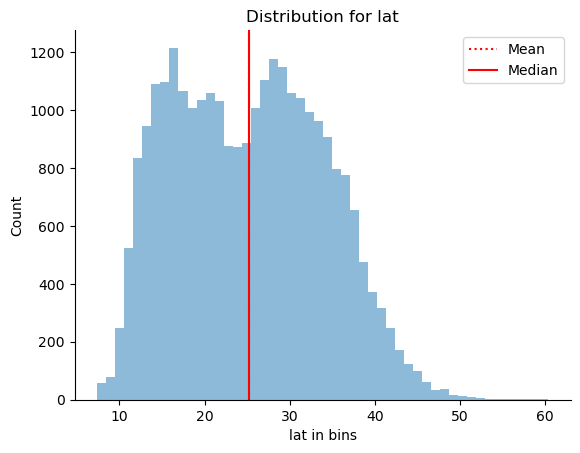

In [47]:
# histogram for latitude values
dist_plot(eda_df, 'lat', 'hist', 50)

It's quite interesting to see a |bimodal distribution for the latitude of storms. There are two possibilities for this:
1. One set of storms start or originate closer to the equator, while another set starts further to the north.
2. It could also mark the difference between depressions which originate and run out of steam quicker, and fully formed storms that tend to have longer paths that veer north with time.

Let's test the second option.

In [258]:

eda_df[eda_df['category']=='severe']['lat'].quantile(.95) - eda_df[eda_df['category']=='severe']['lat'].quantile(.05)

20.469999999999985

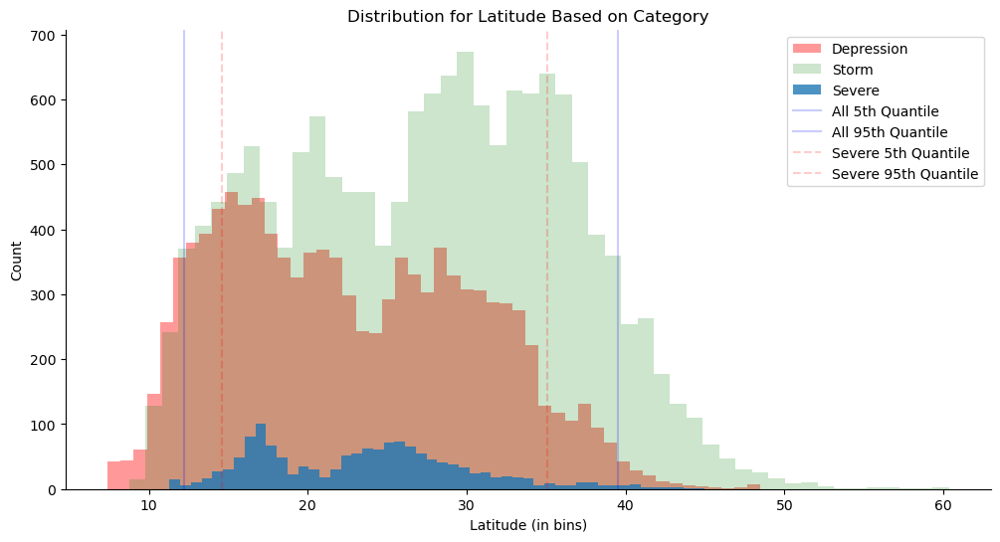

In [328]:
# distribution of latitude values by storm `category`
plt.figure(figsize=(12,6))

plt.hist(eda_df[eda_df['category']=='depression']['lat'], alpha=0.4, bins=50, label='Depression', color='red')
plt.hist(eda_df[eda_df['category']=='storm']['lat'], alpha=0.2, bins=50, label='Storm', color='green')
plt.hist(eda_df[eda_df['category']=='severe']['lat'], alpha=0.8, bins=50, label='Severe')
plt.axvline(eda_df['lat'].quantile(.05), linestyle='-', color='b', alpha=0.2, label='All 5th Quantile')
plt.axvline(eda_df['lat'].quantile(.95), linestyle='-', color='b', alpha=0.2, label='All 95th Quantile')
plt.axvline(eda_df[eda_df['category']=='severe']['lat'].quantile(.05), linestyle='--', color='r', alpha=0.2, label='Severe 5th Quantile')
plt.axvline(eda_df[eda_df['category']=='severe']['lat'].quantile(.95), linestyle='--', color='r', alpha=0.2, label='Severe 95th Quantile')
plt.title('Distribution for Latitude Based on Category')
plt.xlabel('Latitude (in bins)')
plt.ylabel('Count')

plt.legend()
sns.despine()
plt.show()

Evidently, the bimodality might be related more to the origin of the storm than its severity. We will check on this later when we examine correlations.

Another interesting thing to note is the relative clustering of 'severe' storms between latitude values of 10 and 40. This points towards a 'sweet spot' for storm intensity maxing out.

In [289]:
# quantiles for `lat` of 'severe' storms
print(f"90% of Severe storms fall between latitudes {eda_df[eda_df['category']=='severe']['lat'].quantile(.05).round(2)}degree and {eda_df[eda_df['category']=='severe']['lat'].quantile(.95).round(2)}degree.")

90% of Severe storms fall between latitudes 14.6degree and 35.07degree.


#### `lon` column

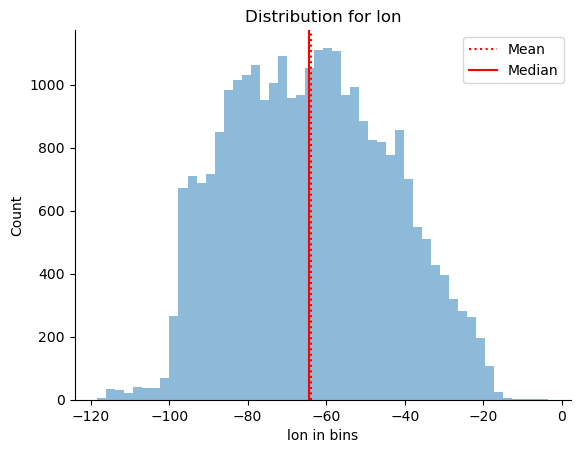

In [49]:
# histogram for longitude values
dist_plot(eda_df, 'lon', 'hist', 50)

The Longitudes are relatively normally distributed however, there is a hint of bimodality here. This follows conventional logic as storms tend to originate towards the eastern regions of the atlantic and move westwards. 

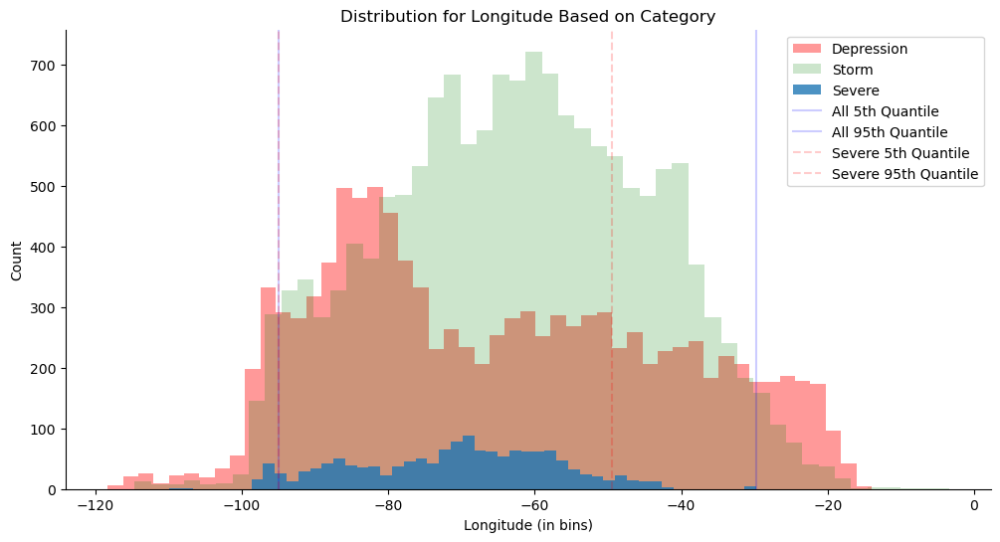

In [327]:
# distribution of longitude values by storm `category`
plt.figure(figsize=(12,6))

plt.hist(eda_df[eda_df['category']=='depression']['lon'], alpha=0.4, bins=50, label='Depression', color='red')
plt.hist(eda_df[eda_df['category']=='storm']['lon'], alpha=0.2, bins=50, label='Storm', color='green')
plt.hist(eda_df[eda_df['category']=='severe']['lon'], alpha=0.8, bins=50, label='Severe')
plt.axvline(eda_df['lon'].quantile(.05), linestyle='-', color='b', alpha=0.2, label='All 5th Quantile')
plt.axvline(eda_df['lon'].quantile(.95), linestyle='-', color='b', alpha=0.2, label='All 95th Quantile')
plt.axvline(eda_df[eda_df['category']=='severe']['lon'].quantile(.05), linestyle='--', color='r', alpha=0.2, label='Severe 5th Quantile')
plt.axvline(eda_df[eda_df['category']=='severe']['lon'].quantile(.95), linestyle='--', color='r', alpha=0.2, label='Severe 95th Quantile')
plt.title('Distribution for Longitude Based on Category')
plt.xlabel('Longitude (in bins)')
plt.ylabel('Count')

plt.legend()
sns.despine()
plt.show()

As was the case with latitude values, we see a clustering of longitude values for 'severe' storms between -100 and -40.

In [292]:
# quantiles for `lon` of 'severe' storms
print(f"90% of Severe storms fall between longitudes {eda_df[eda_df['category']=='severe']['lon'].quantile(.05).round(2)}degree and {eda_df[eda_df['category']=='severe']['lon'].quantile(.95).round(2)}degree.")

90% of Severe storms fall between longitudes -94.99degree and -49.44degree.


#### `dist2land` column

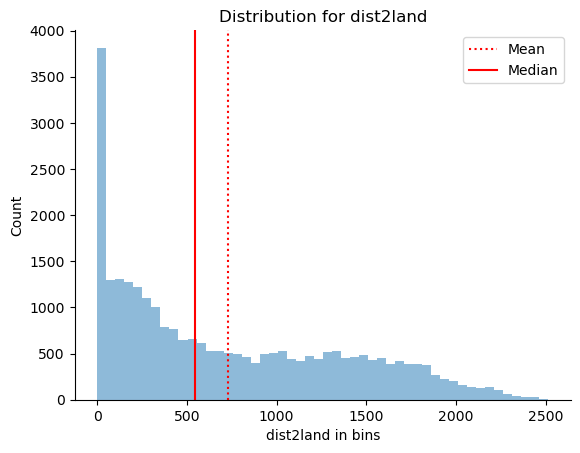

In [50]:
dist_plot(eda_df, 'dist2land', 'hist', 50)

We see a heavy right skew to the distribution. A thing to note here is that '0' represents storms that made landfall and also represents every subsequent measurement where the storm was over a landmass. Let's see how many storms out of those tracked made landfall between 1959 and 1999. We will work with the `storm_df` dataframe as we will need access to the unique storm IDs `sid` it contains. 

In [326]:
# number and percentage of storms making landfall
landfall_number = (storm_df[storm_df['dist2land']==0].groupby(storm_df['sid']).count().shape[0])
landfall_percent = round((landfall_number / storm_df.shape[0] * 100), 2)
print(f"{landfall_number} storms made landfall which account for {landfall_percent}% of tracked storms.")

268 storms made landfall which account for 0.97% of tracked storms.


Less than $1\%$ of storms tracked made landfall, however we must remember that storms that come within a certain distance of land still cause massive damage and disruption.

#### `wind_surface` column

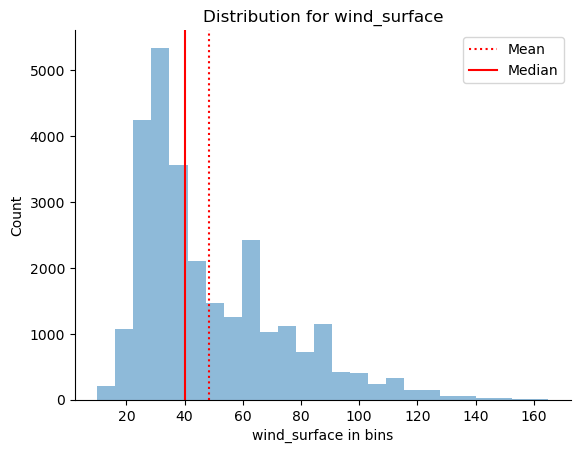

In [51]:
dist_plot(eda_df, 'wind_surface', 'hist')

There is a strong right skew to the distribution. This is to be expected as only a few storms develop to an extent where the surface wind speeds reach very high values.

#### `pressure_surface` column

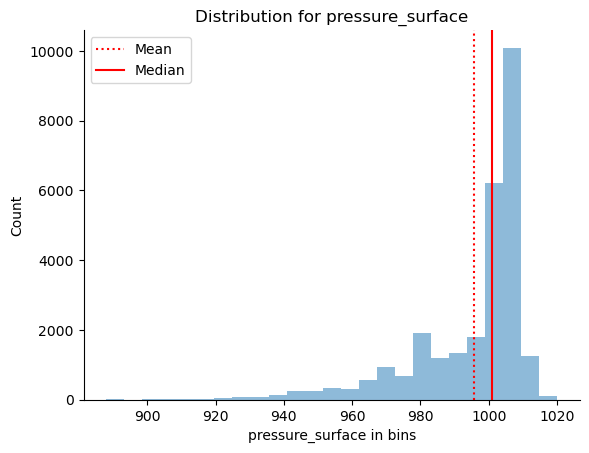

In [52]:
dist_plot(eda_df, 'pressure_surface', 'hist')

The distribution for the `pressure_surface` column is almost a mirror of the `wind_surface` column. This is again due to the fact that low pressures tend to denote more severe storms. However, it is quite interesting to note the number of pressure values above 1000hPa. This tells us that depressions/disturbances can begin at relatively higher pressures.  

#### `category` column

In [53]:
eda_df['category'].value_counts(normalize=True)

storm         0.553703
depression    0.394210
severe        0.052087
Name: category, dtype: float64

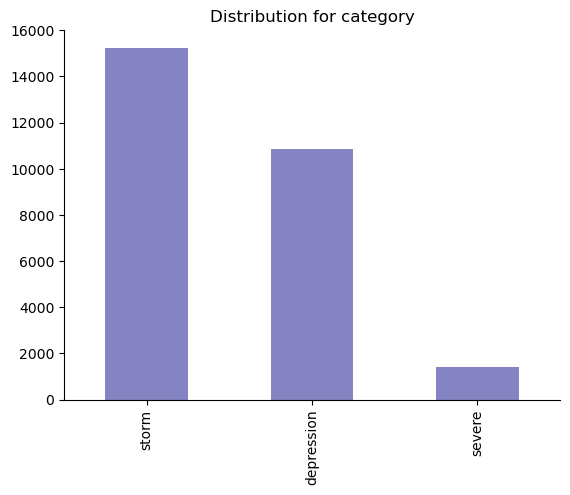

In [54]:
dist_plot(eda_df, 'category', 'bar')

As expected, only a very few storms (~5%) develop to 'severe' status. But we know that these storms inflict massive damage to life and property every year. 

#### `storm_speed` column

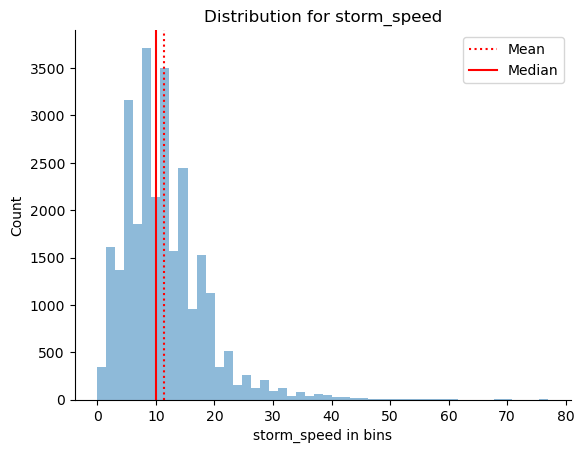

In [55]:
dist_plot(eda_df, 'storm_speed', 'hist', 50)

The distribution looks somewhat bimodal and right skewed with some extreme outliers. Later on we will test correlations and try to uncover if there is a specific reason for the outliers and bimodality. 

#### `storm_dir` column

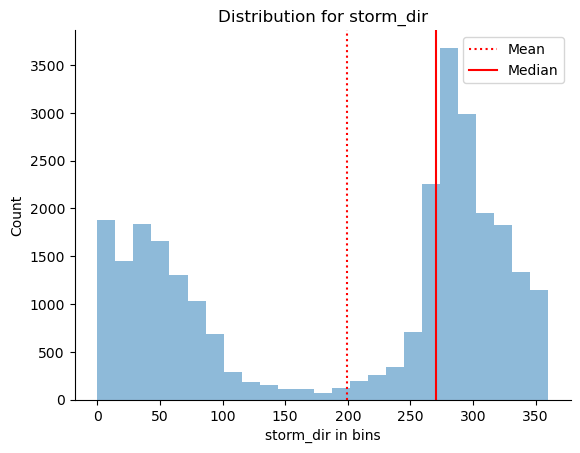

In [56]:
dist_plot(eda_df, 'storm_dir', 'hist')

*Note: 0 represents North, 90 represents East, 180 represents South, and 270 represents West.*

This distribution highlights a very interesting feature of tropical storms in the Northern Hemishpere. The majority of storms tend to move in a Northwesterly direction. Some storms, if they last long enough, curl north and east. Storms rarely move to the south (in this case towards the equator), as the Corioles force is zero at the equator. The Corioles force is responsible for generating the spin in tropical storms.

#### `geo_250`, `geo_550`, and `geo_850` column

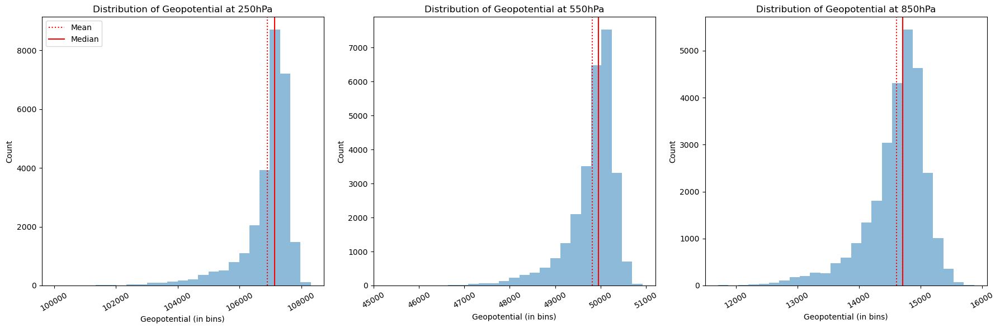

In [176]:
# subplots for geopotential columns
plt.subplots(1, 3, figsize=(18,6))

plt.subplot(1, 3, 1)
plt.hist(eda_df['geo_250'], bins=25, alpha=0.5)
plt.title('Distribution of Geopotential at 250hPa')
plt.xlabel('Geopotential (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['geo_250'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['geo_250'].median(), linestyle='-', color='r', label='Median')
plt.legend()
plt.xticks(rotation=30)

plt.subplot(1, 3, 2)
plt.hist(eda_df['geo_550'], bins=25, alpha=0.5)
plt.title('Distribution of Geopotential at 550hPa')
plt.xlabel('Geopotential (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['geo_550'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['geo_550'].median(), linestyle='-', color='r', label='Median')
plt.xticks(rotation=30)

plt.subplot(1, 3, 3)
plt.hist(eda_df['geo_850'], bins=25, alpha=0.5)
plt.title('Distribution of Geopotential at 850hPa')
plt.xlabel('Geopotential (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['geo_850'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['geo_850'].median(), linestyle='-', color='r', label='Median')
plt.xticks(rotation=30)

plt.tight_layout()

plt.show()

*Note: Geopotential measured in $m^2s^{-2}$.*

The distributions have a distinct left skew. This might be due to Geopotential at each pressure level dropping as as storm gets more severe. Let's compare geopotential distributions at different pressure levels by the intensity of the storm (1category` column).

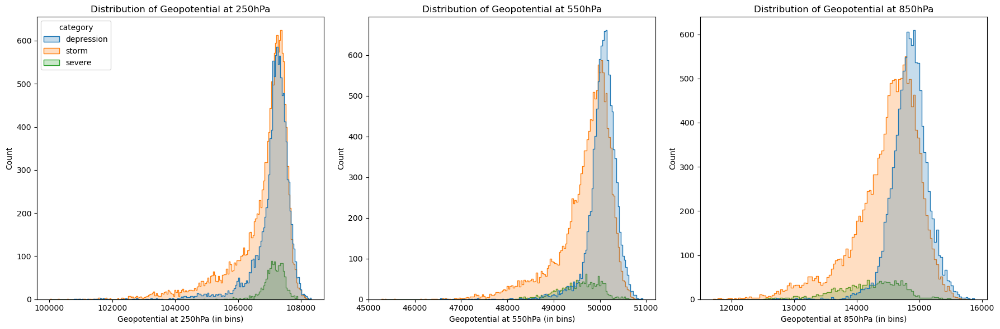

In [173]:
plt.subplots(1, 3, figsize=(18,6))

plt.subplot(1, 3, 1)
ax = sns.histplot(data=eda_df, x='geo_250', hue='category', element='step')
sns.move_legend(ax, 'upper left')
plt.title('Distribution of Geopotential at 250hPa')
plt.xlabel('Geopotential at 250hPa (in bins)')

plt.subplot(1, 3, 2)
sns.histplot(data=eda_df, x='geo_550', hue='category', element='step', legend=False)
plt.title('Distribution of Geopotential at 550hPa')
plt.xlabel('Geopotential at 550hPa (in bins)')

plt.subplot(1, 3, 3)
sns.histplot(data=eda_df, x='geo_850', hue='category', element='step', legend=False)
plt.title('Distribution of Geopotential at 850hPa')
plt.xlabel('Geopotential at 850hPa (in bins)')

plt.tight_layout()
plt.show()

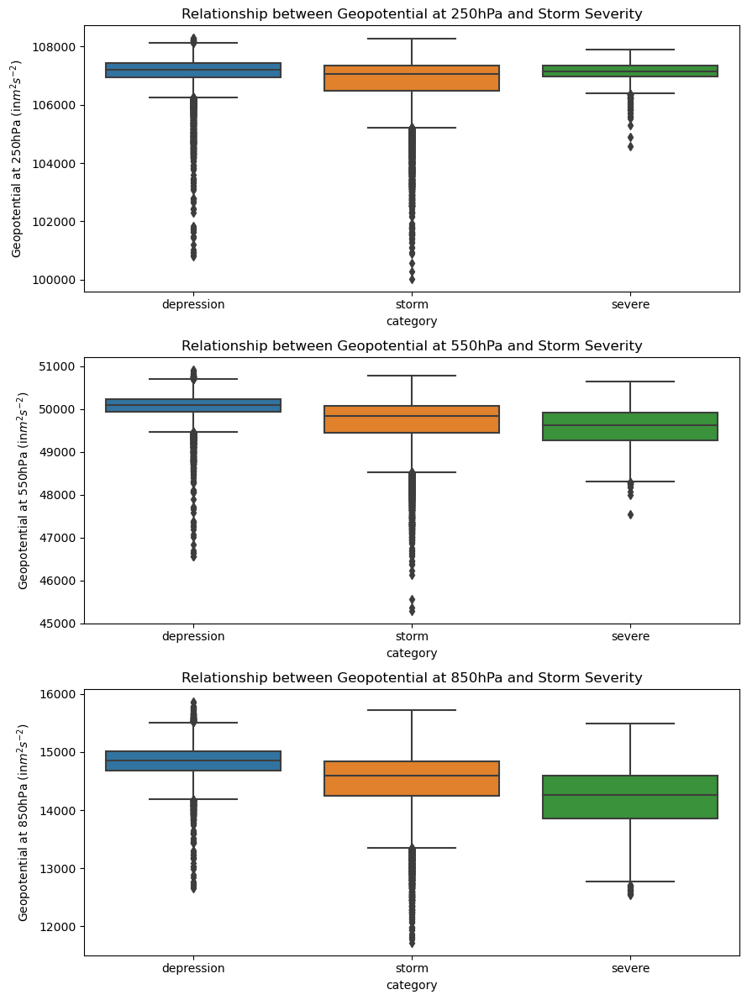

In [175]:
plt.subplots(3, 1, figsize=(9,12))

plt.subplot(3, 1, 1)
sns.boxplot(data=eda_df, x='category', y='geo_250')
plt.title('Relationship between Geopotential at 250hPa and Storm Severity')
plt.ylabel('Geopotential at 250hPa (in$m^2s^{-2}$)')

plt.subplot(3, 1, 2)
sns.boxplot(data=eda_df, x='category', y='geo_550')
plt.title('Relationship between Geopotential at 550hPa and Storm Severity')
plt.ylabel('Geopotential at 550hPa (in$m^2s^{-2}$)')

plt.subplot(3, 1, 3)
sns.boxplot(data=eda_df, x='category', y='geo_850')
plt.title('Relationship between Geopotential at 850hPa and Storm Severity')
plt.ylabel('Geopotential at 850hPa (in$m^2s^{-2}$)')

plt.tight_layout()
plt.show()

Our assumption about the reason for left skew appears to be correct. We can see that geopotential tends to drop with the severity of the storm. Moreover, this relationship becomes more apparent the closer we get to the surface. The relationship is not evident at the 250hPa pressure level. 

#### `u_wind_250`, `u_wind_550`, and `u_wind_850` columns

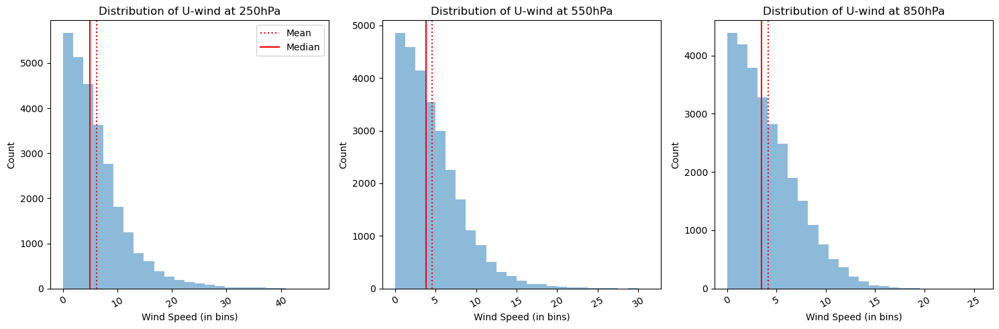

In [140]:
# subplots for u-wind columns
plt.subplots(1, 3, figsize=(15,5))

plt.subplot(1, 3, 1)
plt.hist(eda_df['u_wind_250'], bins=25, alpha=0.5)
plt.title('Distribution of U-wind at 250hPa')
plt.xlabel('Wind Speed (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['u_wind_250'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['u_wind_250'].median(), linestyle='-', color='r', label='Median')
plt.xticks(rotation=30)
plt.legend()

plt.subplot(1, 3, 2)
plt.hist(eda_df['u_wind_550'], bins=25, alpha=0.5)
plt.title('Distribution of U-wind at 550hPa')
plt.xlabel('Wind Speed (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['u_wind_550'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['u_wind_550'].median(), linestyle='-', color='r', label='Median')
plt.xticks(rotation=30)

plt.subplot(1, 3, 3)
plt.hist(eda_df['u_wind_850'], bins=25, alpha=0.5)
plt.title('Distribution of U-wind at 850hPa')
plt.xlabel('Wind Speed (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['u_wind_850'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['u_wind_850'].median(), linestyle='-', color='r', label='Median')
plt.xticks(rotation=30)

plt.tight_layout()

plt.show()

*Note: Wind speeds are measured in knots.*<br>

There is an obvious right skew to the distribution. That makes sense as higher wind speeds occur in more severe storms which are rare.

#### `u_dir_250`, `u_dir_550`, and `u_dir_850` columns

*Note: 1 denotes Eastward wind and 0 denotes Westward wind*

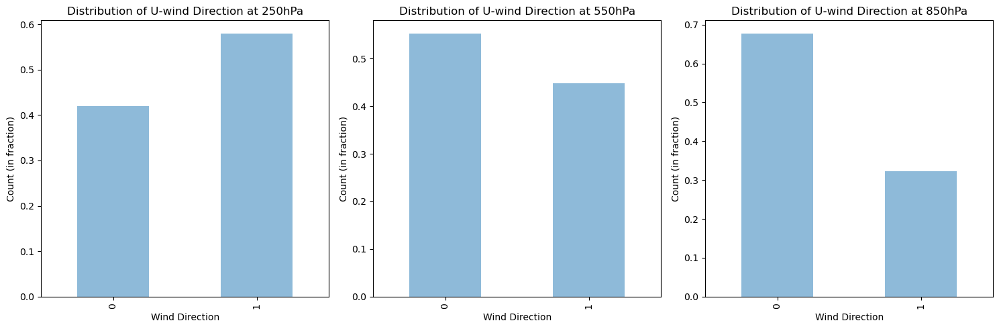

In [187]:
# subplots for u-wind columns
plt.subplots(1, 3, figsize=(15,5))

plt.subplot(1, 3, 1)
eda_df['u_dir_250'].value_counts(normalize=True).sort_index().plot(x='u_dir_250', kind='bar', alpha=0.5)
plt.title('Distribution of U-wind Direction at 250hPa')
plt.xlabel('Wind Direction')
plt.ylabel('Count (in fraction)')


plt.subplot(1, 3, 2)
eda_df['u_dir_550'].value_counts(normalize=True).sort_index().plot(kind='bar', alpha=0.5)
plt.title('Distribution of U-wind Direction at 550hPa')
plt.xlabel('Wind Direction')
plt.ylabel('Count (in fraction)')

plt.subplot(1, 3, 3)
eda_df['u_dir_850'].value_counts(normalize=True).sort_index().plot(kind='bar', alpha=0.5)
plt.title('Distribution of U-wind Direction at 850hPa')
plt.xlabel('Wind Direction')
plt.ylabel('Count (in fraction)')

plt.tight_layout()

plt.show()

Higher fraction of westward winds expected for 550hPa and 850hPa levels as the storms overall move from east to west for the majority of their lifecycle. The higher fraction of Eastward wind at height of 250 hPa might be due to the presence of unrelated tradewinds at that altitude. 

#### `v_wind_250`, `v_wind_550`, and `v_wind_850` columns

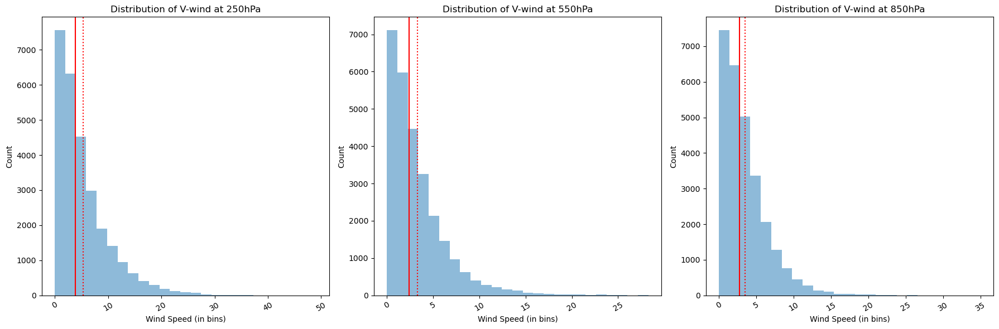

In [190]:
# subplots for v-wind columns
plt.subplots(1, 3, figsize=(18,6))

plt.subplot(1, 3, 1)
plt.hist(eda_df['v_wind_250'], bins=25, alpha=0.5)
plt.title('Distribution of V-wind at 250hPa')
plt.xlabel('Wind Speed (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['v_wind_250'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['v_wind_250'].median(), linestyle='-', color='r', label='Median')
plt.xticks(rotation=30)

plt.subplot(1, 3, 2)
plt.hist(eda_df['v_wind_550'], bins=25, alpha=0.5)
plt.title('Distribution of V-wind at 550hPa')
plt.xlabel('Wind Speed (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['v_wind_550'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['v_wind_550'].median(), linestyle='-', color='r', label='Median')
plt.xticks(rotation=30)

plt.subplot(1, 3, 3)
plt.hist(eda_df['v_wind_850'], bins=25, alpha=0.5)
plt.title('Distribution of V-wind at 850hPa')
plt.xlabel('Wind Speed (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['v_wind_850'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['v_wind_850'].median(), linestyle='-', color='r', label='Median')
plt.xticks(rotation=30)

plt.tight_layout()

plt.show()

Similar to u_wind, the distribution has a distinct right skew due to higher wind speeds being rarer. 

#### `v_dir_250`, `v_dir_550`, and `v_dir_850` columns

*Note: 1 denotes Northward wind and 0 denotes Southward wind*

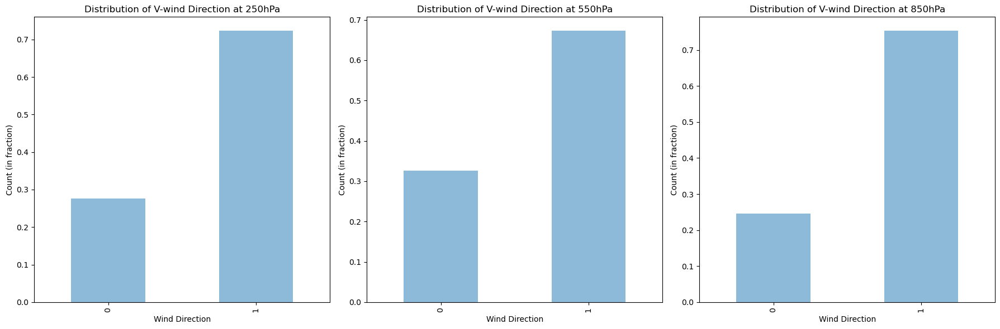

In [191]:
# subplots for u-wind columns
plt.subplots(1, 3, figsize=(18,6))

plt.subplot(1, 3, 1)
eda_df['v_dir_250'].value_counts(normalize=True).sort_index().plot(kind='bar', alpha=0.5)
plt.title('Distribution of V-wind Direction at 250hPa')
plt.xlabel('Wind Direction')
plt.ylabel('Count (in fraction)')


plt.subplot(1, 3, 2)
eda_df['v_dir_550'].value_counts(normalize=True).sort_index().plot(kind='bar', alpha=0.5)
plt.title('Distribution of V-wind Direction at 550hPa')
plt.xlabel('Wind Direction')
plt.ylabel('Count (in fraction)')

plt.subplot(1, 3, 3)
eda_df['v_dir_850'].value_counts(normalize=True).sort_index().plot(kind='bar', alpha=0.5)
plt.title('Distribution of V-wind Direction at 850hPa')
plt.xlabel('Wind Direction')
plt.ylabel('Count (in fraction)')

plt.tight_layout()

plt.show()

The fraction of winds moving northward is higher. This is explained by storm paths which rarely tend to move towards the south due to the Corioles force. The presence of any southward component at all is probably because of the rotational nature of winds in a Tropical storm.

#### `humid_250`, `humid_550`, and `humid_850` column

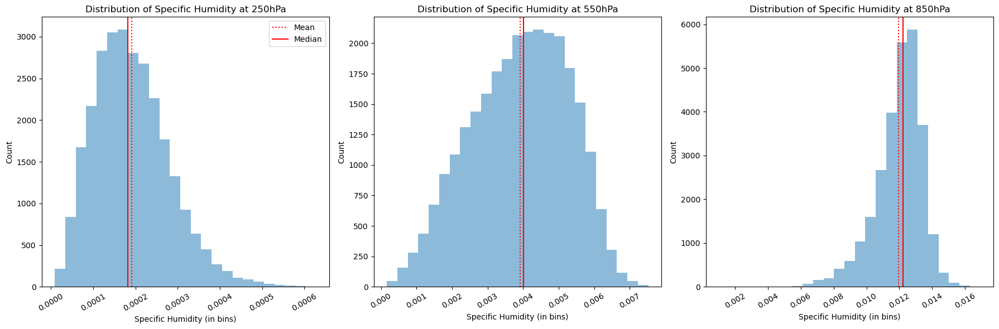

In [192]:
# subplots for Specific Humidity columns
plt.subplots(1, 3, figsize=(18,6))

plt.subplot(1, 3, 1)
plt.hist(eda_df['humid_250'], bins=25, alpha=0.5)
plt.title('Distribution of Specific Humidity at 250hPa')
plt.xlabel('Specific Humidity (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['humid_250'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['humid_250'].median(), linestyle='-', color='r', label='Median')
plt.legend()
plt.xticks(rotation=30)

plt.subplot(1, 3, 2)
plt.hist(eda_df['humid_550'], bins=25, alpha=0.5)
plt.title('Distribution of Specific Humidity at 550hPa')
plt.xlabel('Specific Humidity (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['humid_550'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['humid_550'].median(), linestyle='-', color='r', label='Median')
plt.xticks(rotation=30)

plt.subplot(1, 3, 3)
plt.hist(eda_df['humid_850'], bins=25, alpha=0.5)
plt.title('Distribution of Specific Humidity at 850hPa')
plt.xlabel('Specific Humidity (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['humid_850'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['humid_850'].median(), linestyle='-', color='r', label='Median')
plt.xticks(rotation=30)

plt.tight_layout()

plt.show()

_NOTE: the unit for specific humidity is $kg\,kg^{-1}$ ._

There are two observations of note:
1. The distributions for Specific Humidity are quite normally distributed with `humid_250` displaying some right-skewness. `humid_ 550` and `humid_850` display relatively minor left skewness. 
2. The specific humidity decreases quite proportionally with increase in altitude. 

Moisture structure is known to play an important role in tropical storm genesis frequency, density, and intensity. 

Let's see if we can identify any trends plotting humidity distribution by storm `category`.

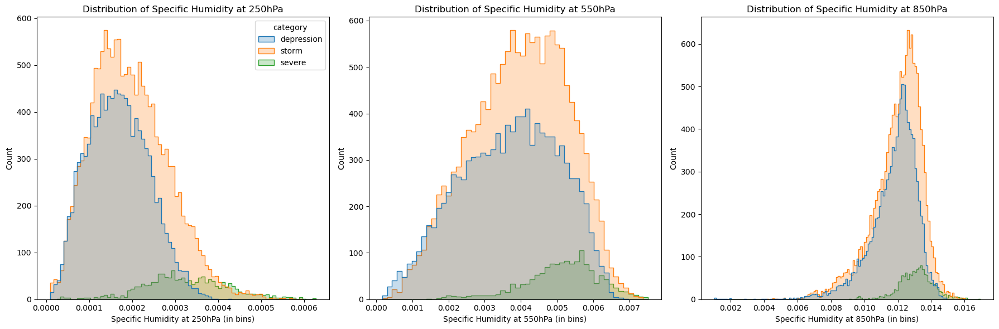

In [101]:
# distribution histogram plots for specific humidity by storm `category` at different pressure levels
plt.subplots(1, 3, figsize=(18,6))

plt.subplot(1, 3, 1)
sns.histplot(data=eda_df, x='humid_250', hue='category', element='step')
plt.title('Distribution of Specific Humidity at 250hPa')
plt.xlabel('Specific Humidity at 250hPa (in bins)')

plt.subplot(1, 3 ,2)
sns.histplot(data=eda_df, x='humid_550', hue='category', element='step', legend=False)
plt.title('Distribution of Specific Humidity at 550hPa')
plt.xlabel('Specific Humidity at 550hPa (in bins)')

plt.subplot(1, 3 ,3)
sns.histplot(data=eda_df, x='humid_850', hue='category', element='step', legend=False)
plt.title('Distribution of Specific Humidity at 850hPa')
plt.xlabel('Specific Humidity at 850hPa (in bins)')

plt.tight_layout()
plt.show()

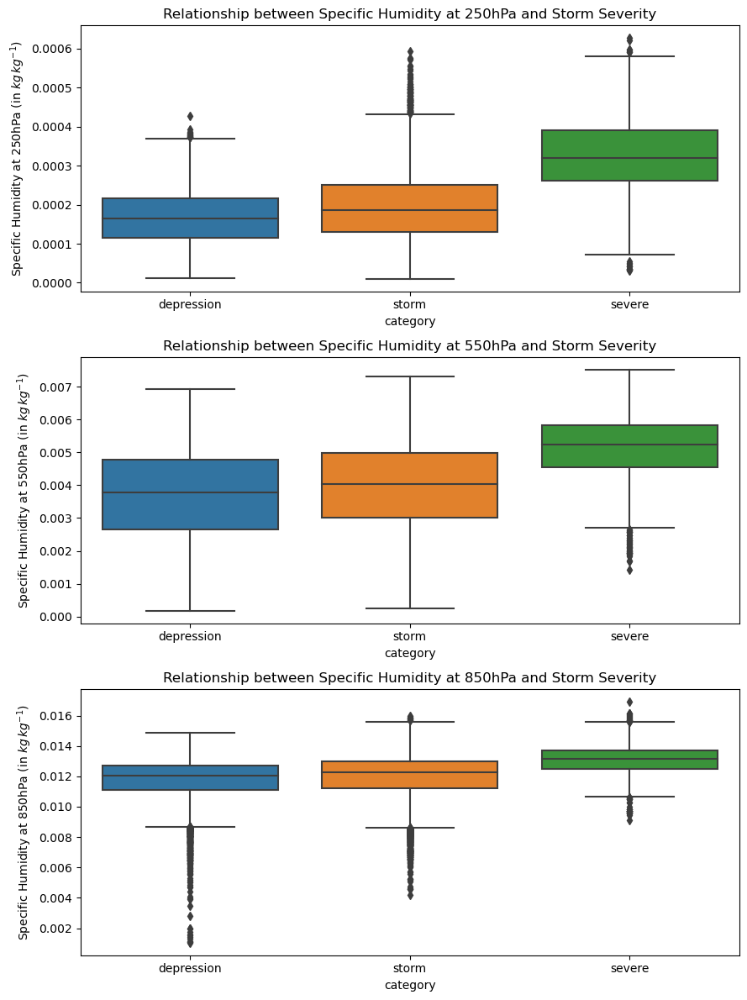

In [196]:
# distribution box-plots for specific humidity by storm `category` at different pressure levels
plt.subplots(3, 1, figsize=(9,12))

plt.subplot(3, 1, 1)
sns.boxplot(data=eda_df, x='category', y='humid_250')
plt.title('Relationship between Specific Humidity at 250hPa and Storm Severity')
plt.ylabel('Specific Humidity at 250hPa (in $kg\,kg^{-1}$)')

plt.subplot(3, 1, 2)
sns.boxplot(data=eda_df, x='category', y='humid_550')
plt.title('Relationship between Specific Humidity at 550hPa and Storm Severity')
plt.ylabel('Specific Humidity at 550hPa (in $kg\,kg^{-1}$)')

plt.subplot(3, 1, 3)
sns.boxplot(data=eda_df, x='category', y='humid_850')
plt.title('Relationship between Specific Humidity at 850hPa and Storm Severity')
plt.ylabel('Specific Humidity at 850hPa (in $kg\,kg^{-1}$)')

plt.tight_layout()
plt.show()

There is a marked increase in storm severity with increased specific humidity at all three pressure levels. This is especially evident for storms falling under the 'severe' `category`.

#### `temp_250`, `temp_550`, and `temp_850` column

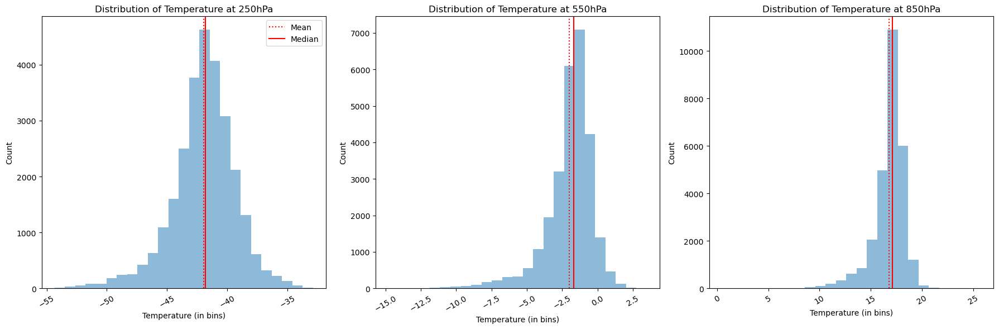

In [197]:
# subplots for Temperature columns
plt.subplots(1, 3, figsize=(18,6))

plt.subplot(1, 3, 1)
plt.hist(eda_df['temp_250'], bins=25, alpha=0.5)
plt.title('Distribution of Temperature at 250hPa')
plt.xlabel('Temperature (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['temp_250'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['temp_250'].median(), linestyle='-', color='r', label='Median')
plt.legend()
plt.xticks(rotation=30)

plt.subplot(1, 3, 2)
plt.hist(eda_df['temp_550'], bins=25, alpha=0.5)
plt.title('Distribution of Temperature at 550hPa')
plt.xlabel('Temperature (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['temp_550'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['temp_550'].median(), linestyle='-', color='r', label='Median')
plt.xticks(rotation=30)

plt.subplot(1, 3, 3)
plt.hist(eda_df['temp_850'], bins=25, alpha=0.5)
plt.title('Distribution of Temperature at 850hPa')
plt.xlabel('Temperature (in bins)')
plt.ylabel('Count')
plt.axvline(eda_df['temp_850'].mean(), linestyle=':', color='r', label='Mean')
plt.axvline(eda_df['temp_850'].median(), linestyle='-', color='r', label='Median')
plt.xticks(rotation=30)

plt.tight_layout()

plt.show()

_NOTE: the unit for specific humidity is $C$ (Celsius) ._

There are two observations of note:
1. The distributions for temperature at all levels appears to be quite close to a normal distribution, albeit with a small degree of left-skew. 
2. As expected the temperature drops quite sharply with increase in altitude.

Like moisture structre, thermal conditions play an important role in tropical storm genesis and intensity.

Again, let's see if we can identify any trends plotting temperature distribution by storm `category`.

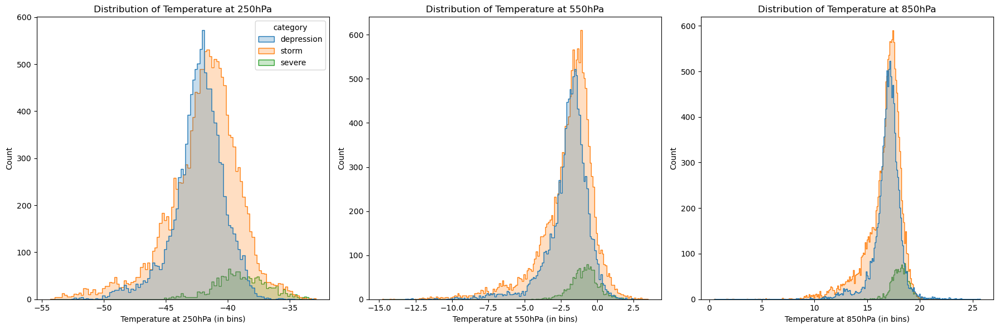

In [118]:
# distribution histogram plots Temperature by storm `category` at different pressure levels
plt.subplots(1, 3, figsize=(18,6))

plt.subplot(1, 3, 1)
sns.histplot(data=eda_df, x='temp_250', hue='category', element='step')
plt.title('Distribution of Temperature at 250hPa')
plt.xlabel('Temperature at 250hPa (in bins)')

plt.subplot(1, 3 ,2)
sns.histplot(data=eda_df, x='temp_550', hue='category', element='step', legend=False)
plt.title('Distribution of Temperature at 550hPa')
plt.xlabel('Temperature at 550hPa (in bins)')

plt.subplot(1, 3 ,3)
sns.histplot(data=eda_df, x='temp_850', hue='category', element='step', legend=False)
plt.title('Distribution of Temperature at 850hPa')
plt.xlabel('Temperature at 850hPa (in bins)')

# sns.despine()
plt.tight_layout()
plt.show()

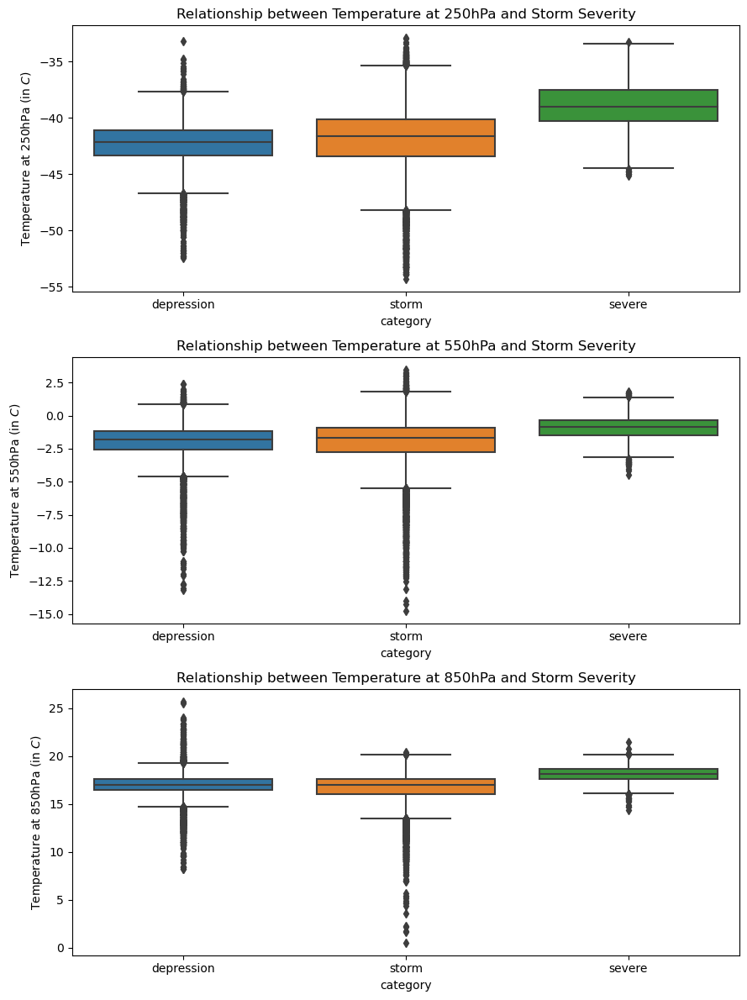

In [147]:
# distribution box-plots for Temperature by storm `category` at different pressure levels
plt.subplots(3, 1, figsize=(9,12))

plt.subplot(3, 1, 1)
sns.boxplot(data=eda_df, x='category', y='temp_250')
plt.title('Relationship between Temperature at 250hPa and Storm Severity')
plt.ylabel('Temperature at 250hPa (in $C$)')

plt.subplot(3, 1, 2)
sns.boxplot(data=eda_df, x='category', y='temp_550')
plt.title('Relationship between Temperature at 550hPa and Storm Severity')
plt.ylabel('Temperature at 550hPa (in $C$)')

plt.subplot(3, 1, 3)
sns.boxplot(data=eda_df, x='category', y='temp_850')
plt.title('Relationship between Temperature at 850hPa and Storm Severity')
plt.ylabel('Temperature at 850hPa (in $C$)')

plt.tight_layout()
plt.show()

There is an increase in storm severity with increase in temeperature at all levels. The difference in temperatures of 'severe' storms vs the other two seems to be the most pronounced at the 250hPa pressure level.

#### `intensity_delta` column

In [64]:
eda_df['intensity_delta'].value_counts(normalize=True)

0    0.690313
1    0.309687
Name: intensity_delta, dtype: float64

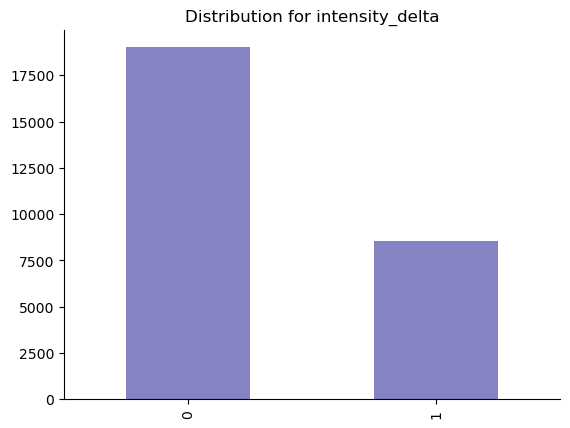

In [65]:
dist_plot(eda_df, 'intensity_delta', 'bar')

Increases in intensity are rare. This is for the better as it means storms in general are less likely to increase in severity.

### Relationships and Correlation between Variables

Even though there are a lot of columns, let's look at a pairplot to see if we can identify any trends and relationships. I will drop some columns that aren't useful here. To try and maintain some interpretability, I will only use geopotential, temperature, humidity, and u,v wind values for 850 hPa pressure level.  

In [208]:
eda_df.columns

Index(['time', 'lat', 'lon', 'dist2land', 'wind_surface', 'pressure_surface',
       'category', 'storm_speed', 'storm_dir', 'geo_250', 'humid_250',
       'temp_250', 'u_wind_250', 'u_dir_250', 'v_wind_250', 'v_dir_250',
       'geo_550', 'humid_550', 'temp_550', 'u_wind_550', 'u_dir_550',
       'v_wind_550', 'v_dir_550', 'geo_850', 'humid_850', 'temp_850',
       'u_wind_850', 'u_dir_850', 'v_wind_850', 'v_dir_850', 'wind_lag',
       'intensity_delta'],
      dtype='object')

<Figure size 1500x1500 with 0 Axes>

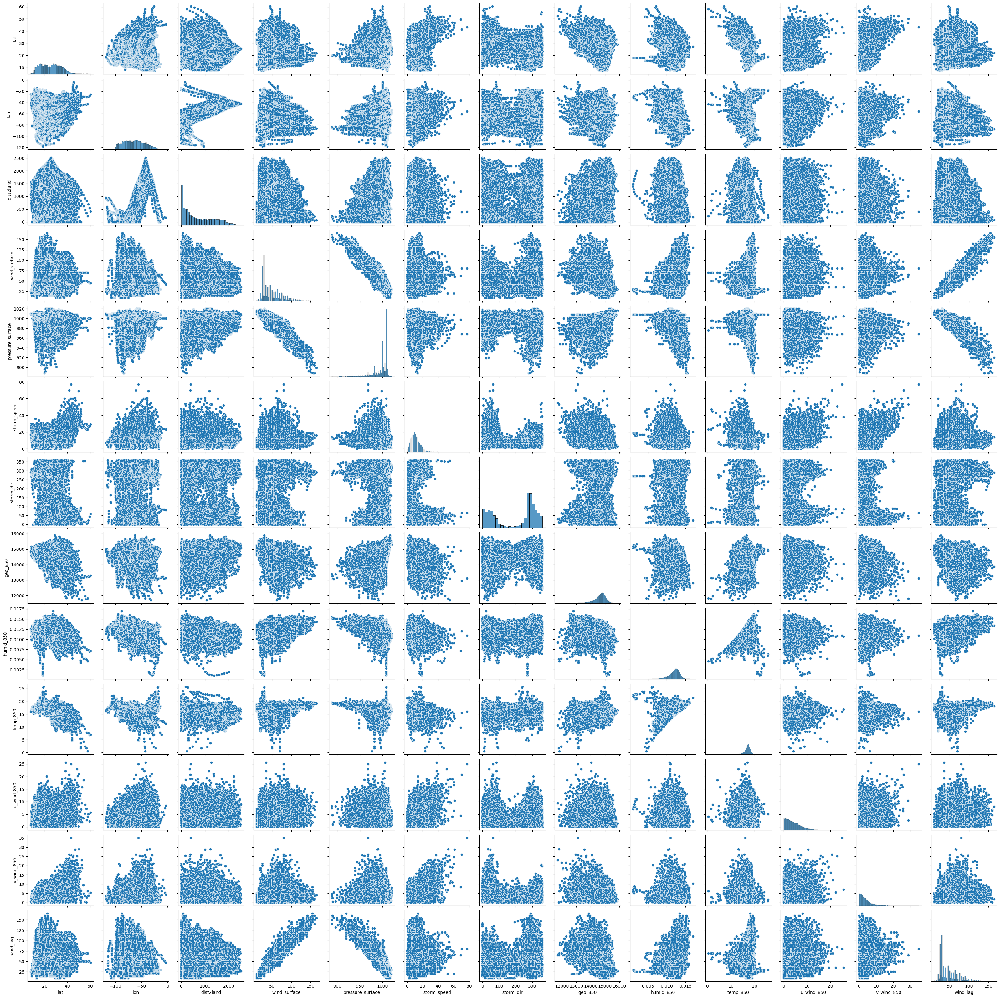

In [150]:
plt.figure(figsize=(15,15))
sns.pairplot(eda_df.drop(columns=['time', 'geo_550', 'humid_550', 'temp_550', 'u_wind_550', 'v_wind_550', 'u_dir_550', 'v_dir_550',
                                  'geo_250', 'humid_250', 'temp_250', 'u_wind_250', 'v_wind_250', 'u_dir_250', 'v_dir_250',
                                  'intensity_delta', 'u_dir_850', 'v_dir_850']))
sns.despine()
plt.show()

There seem to be a some interesting relationships here. Let's check for correlations in the variables by plotting the correlation matrix on a heatmap.


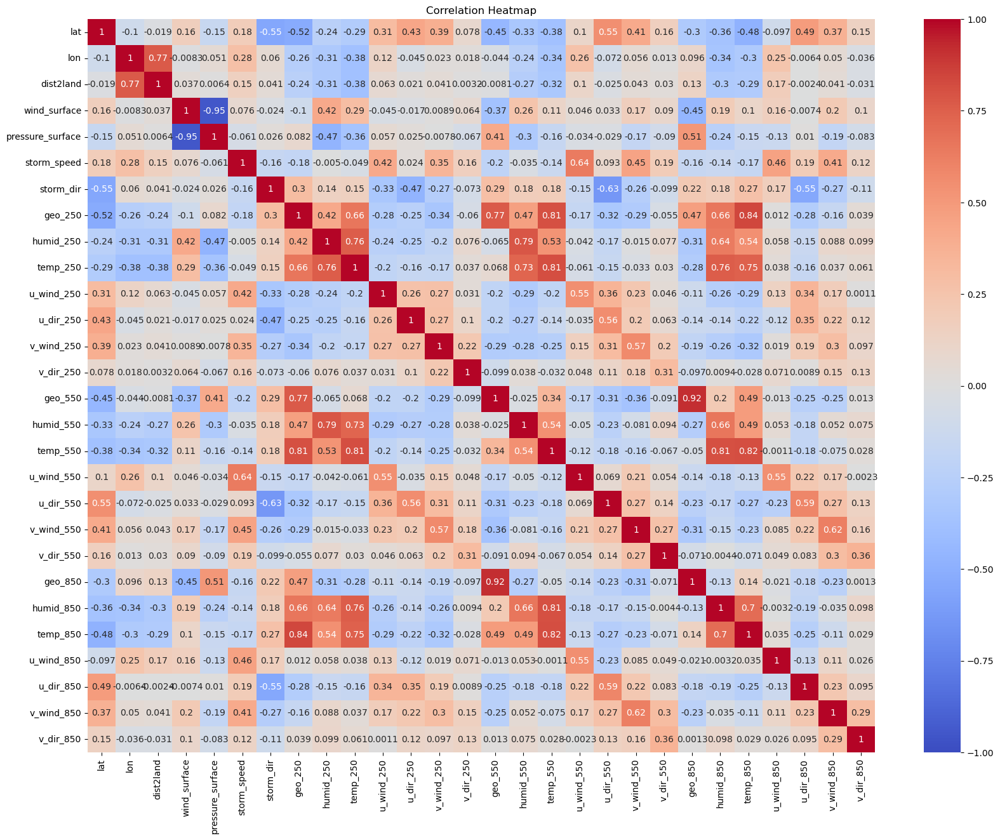

In [209]:
# correlation heatmap after dropping target variable 'intensity_delta' and 'wind_lag'
plt.figure(figsize=(20,15))

sns.heatmap(eda_df.drop(columns=['wind_lag', 'intensity_delta']).corr(), cmap='coolwarm', vmax=1, vmin=-1, annot=True)
plt.title('Correlation Heatmap')

plt.show()

There are a few standout relationships here. 
* `lon` and `dist2land` are closely related as expected based on the geography of the Atlantic and Americas. 
* `wind_surface` and `pressure_surface` have a nearly perfect correlation as wind speeds are based in large part atmospheric pressure. We will have to drop one of these variables after taking a closer look.
* The u-wind i.e. east-west component of the wind seems to have some correlation with `stomr_dir` and `storm_speed`.
* `geo_250` has a higher correlation with `temp_850` and `temp_550` than with `temp_250`. 
*  Specific humidity values are correlated to temperature values as expected. Temperatures at higher pressure levels (250hPa, 550hPa) have a stronger correlation with humidity near the surface than the temperature near the surface (850hPa) does.


*Note: Geopotential and temperature have a certain level of correlation between nearby pressure levels (850hPa and 550hPa, and 250hPa and 550hPa). Therefore, it would not be wise to include all three during modelling.*

*Note: `wind_surface` and `wind_lag` have a near perfect correlation. This is obvious since one was used to derive the other. We won't use `wind_lag` for modelling so it will not be an issue.*

#### `wind_surface` and `pressure_surface`

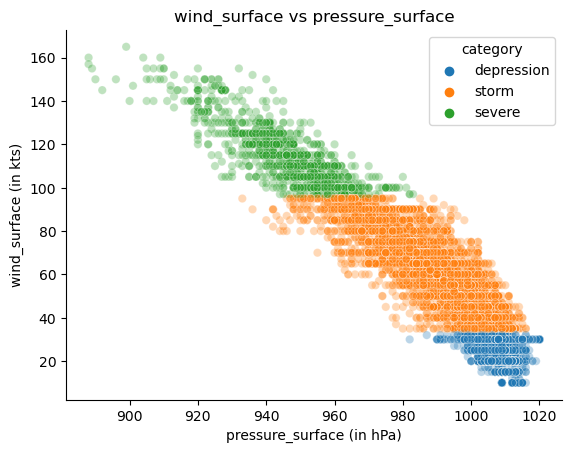

In [217]:
# scatter plot wind_surface vs pressure_surface
plt.figure()

sns.scatterplot(data=eda_df, x='pressure_surface', y='wind_surface', alpha=0.3, hue='category')
plt.title('wind_surface vs pressure_surface')
plt.xlabel('pressure_surface (in hPa)')
plt.ylabel('wind_surface (in kts)')

sns.despine()
plt.show()

Surface wind speed tends to increase almost linearly with a decrease in surface pressure. This is a hallmark characteristic of Tropical sotrms. The low pressure causes wind speeds to increase. Moreover, we can see a very neat distribution of storm severity with a fall in pressure. Lower the pressure, more severe the storm. 

In [218]:
eda_df['wind_surface'].corr(eda_df['pressure_surface'])

-0.9463398033373944

**There is an almost prefect correlation between the variables.** When we model we won't use these variables together. However, since the relationship isn't perfect, we will have to figure out which variable is more important in predicting our target variable. 

#### u_wind and `storm_speed`

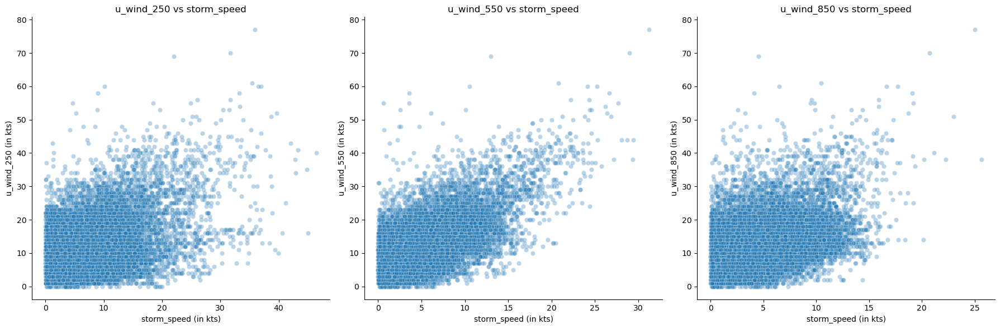

In [232]:
# scatter plot subplots for u_wind at different pressure levels vs `storm_speed``
plt.subplots(1, 3, figsize=(18,6))

plt.subplot(1, 3, 1)
sns.scatterplot(data=eda_df, x='u_wind_250', y='storm_speed', alpha=0.3)
plt.title('u_wind_250 vs storm_speed')
plt.xlabel('storm_speed (in kts)')
plt.ylabel('u_wind_250 (in kts)')

plt.subplot(1, 3, 2)
sns.scatterplot(data=eda_df, x='u_wind_550', y='storm_speed', alpha=0.3)
plt.title('u_wind_550 vs storm_speed')
plt.xlabel('storm_speed (in kts)')
plt.ylabel('u_wind_550 (in kts)')

plt.subplot(1, 3, 3)
sns.scatterplot(data=eda_df, x='u_wind_850', y='storm_speed', alpha=0.3)
plt.title('u_wind_850 vs storm_speed')
plt.xlabel('storm_speed (in kts)')
plt.ylabel('u_wind_850 (in kts)')

sns.despine()
plt.tight_layout()
plt.show()

In [242]:
# pearson correlation
for pres in ['250', '550', '850']:
    coeff = eda_df['u_wind_'+pres].corr(eda_df['storm_speed'])
    print(f'At {pres}hPa: {coeff}')

At 250hPa: 0.42010341533170353
At 550hPa: 0.6377442840700811
At 850hPa: 0.4589304784949641


There is a moderate to strong positive correlation between the east-west wind speed of storms and their movement speeds. The highest correlation is displayed at 550hPa pressure level.

#### `u_dir_550` and `storm_dir`

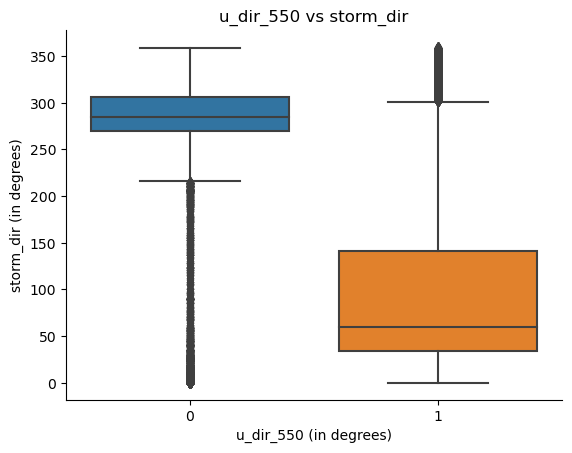

In [250]:
# scatter plot u_wind_550 vs storm_dir
plt.figure()

sns.boxplot(data=eda_df, x='u_dir_550', y='storm_dir')
plt.title('u_dir_550 vs storm_dir')
plt.xlabel('u_dir_550 (in degrees)')
plt.ylabel('storm_dir (in degrees)')

sns.despine()
plt.show()

In [251]:
eda_df['u_dir_550'].corr(eda_df['storm_dir'])

-0.6336157965604385

No major surprises here, Eastward u-wind corresponds to storms moving towards the east. 

**The correlation is quite strong.**

#### `geo_850` and `pressure_surface`

There seems to be a significant relationship between `geo_850` and `pressure_surface`. This is to be expected, as pressure level of 850hPa is close to the surface pressure. This is particularly applicable to tropical storms and depressions as surface pressure is lower for these weather phenomenon.

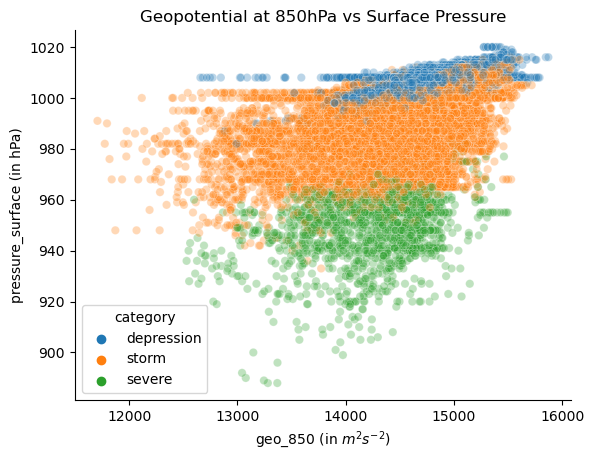

In [210]:
# scatter plot geo_850 vs pressure_surface
plt.figure()

sns.scatterplot(data=eda_df, x='geo_850', y='pressure_surface', alpha=0.3, hue='category')
plt.title('Geopotential at 850hPa vs Surface Pressure')
plt.xlabel('geo_850 (in $m^2s^{-2}$)')
plt.ylabel('pressure_surface (in hPa)')

sns.despine()
plt.show()

As we can see, there seems to be a positive relationship between the two variables. Moreover, the severity of the storm increases with lower surface pressure and lower geopotential at 850hPa. Let's re-check for significance with .corr().

In [247]:
# pearson correlation
eda_df['geo_850'].corr(eda_df['pressure_surface'])

0.5123854489852172

**There is a moderate relationship between the two variables.** This is something to keep in mind while modelling. The relationship isn't strong enough to discard the variable out of hand however.

----

## Summary of Findings

- The distribution for Latitude of storms shows distinct bimodality hinting at difference in origin and path length. 

- 90% of 'severe' storms fall between latitudes 14.6 degree and 35.07 degree.
- Longitude values are normally distributed with a slight hint of bimodality.
- 90% of Severe storms fall between longitudes -94.99 degree and -49.44 degree.
- Less than $1\%$ of storms go on to make landfall.
- Only around 5% of storms achieve super high wind speeds but these storms cause majority of the damage and major disruptions.
- Geopotential tends to be lower for more severe storms especially at pressure levels closer to the surface.
- Storm severity tends to increase with increase in Specific humidity at all pressure levels. More clearly evident for 'severe' storms.
- Storm severity tends to increase with increase in temperature at all pressure levels. Correlation most clearly evident at 250hPa pressure level for 'severe' storms.
- Moderate correlation between Geopotential at 850hPa and surface pressure.
- Near perfect correlation between surface winds and surface pressure. Lower the pressure, the more severe the storm is.
- Strong correlation between u_wind_550 and storm speed. Higher the east-west wind speed the faster the translational movement of the storm.

### Writing to .csv

I will write our resultant dataframe to a .csv for use with the Modelling Notebook.

In [329]:
eda_df.to_csv('data/model_data.csv')

-----